Import library

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pylab as plt
import seaborn as sns
from glob import glob
import librosa
import librosa.display
import IPython.display as ipd

from itertools import cycle

sns.set_theme(style="white", palette="muted")
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle = cycle(plt.rcParams["axes.prop_cycle"].by_key()["color"])


## Terms to know for audio in digital form:
Frequency (Hz):
- Frequency describes the diffrence of wave lengths
- We interpreate frquency has high and low pitches


## Reading in Audio files

In [2]:
audio_files = glob("/home/anhndv/vanh_ws/DCASE2025Task4/data/dev_set/test/soundscape/*.wav")

In [3]:
# Play audio file 
ipd.Audio(audio_files[0], autoplay=True)

In [4]:
y, sr = librosa.load(audio_files[0], sr=None)
print(f"y: {y[:10]} \ny_shape: {y.shape} \nsr: {sr}  ")

y: [-0.00150299 -0.00158691 -0.0015564  -0.0016861  -0.00174713 -0.00187683
 -0.00132751 -0.00152588 -0.00141144 -0.00126648] 
y_shape: (320000,) 
sr: 32000  


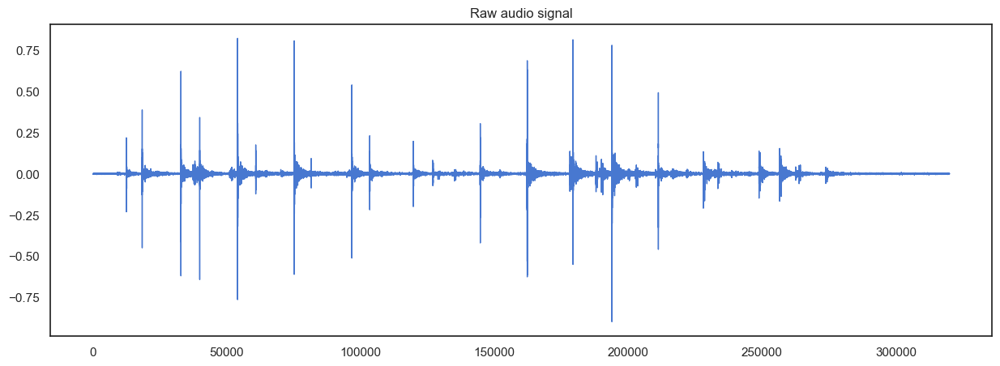

In [5]:
pd.Series(y).plot(figsize=(15, 5), 
                  lw=1,
                  title="Raw audio signal",
                  color=color_pal[0])
plt.show()

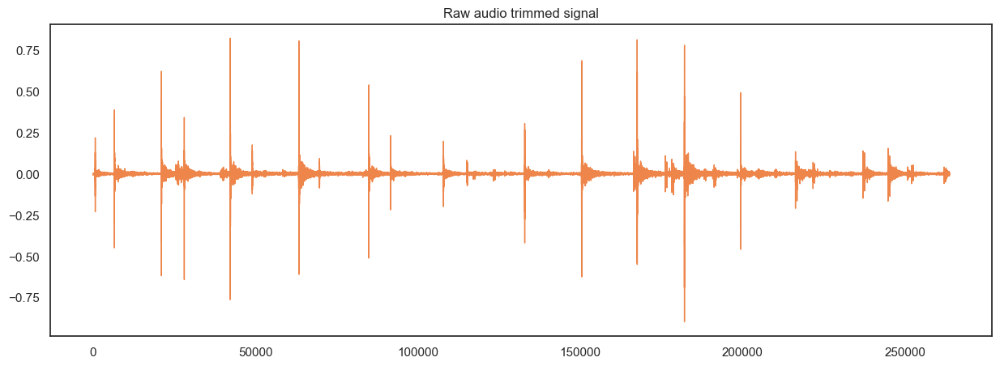

In [6]:
y_trimmed, _ = librosa.effects.trim(y, top_db=20)

pd.Series(y_trimmed).plot(figsize=(15, 5), 
                  lw=1,
                  title="Raw audio trimmed signal",
                  color=color_pal[1])
plt.show()

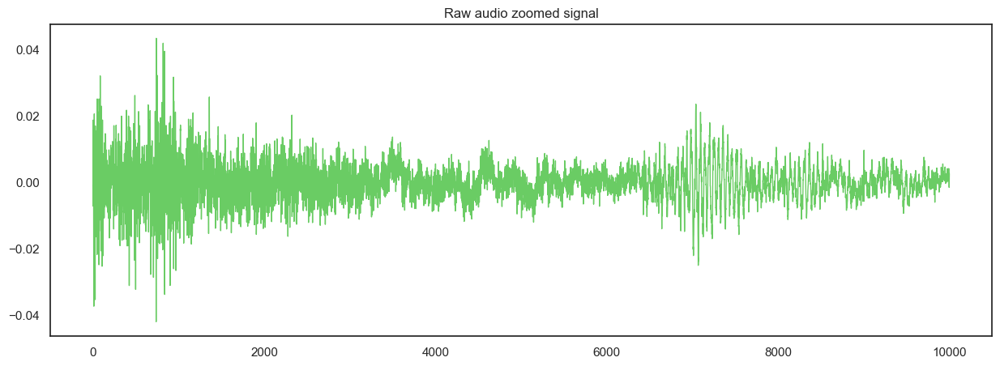

In [7]:
pd.Series(y[145000:155000]).plot(figsize=(15, 5), 
                  lw=1,
                  title="Raw audio zoomed signal",
                  color=color_pal[2])
plt.show()

### Spectoram

In [8]:
D = librosa.stft(y)
S_sb = librosa.amplitude_to_db(np.abs(D), ref=np.max)
S_sb.shape

(1025, 626)

<function matplotlib.pyplot.show(close=None, block=None)>

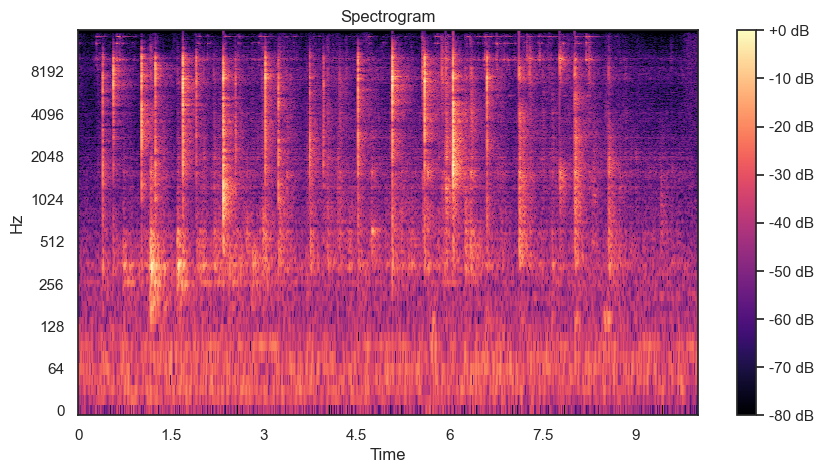

In [9]:
#Plot the transformed spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_sb,
                            x_axis='time',
                            y_axis='log',
                            sr=sr,
                            ax=ax,)
ax.set_title('Spectrogram')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
plt.show

### Mel spectogram

In [10]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=10000)               

S_db_mel = librosa.amplitude_to_db(np.abs(S), ref=np.max)

In [11]:
S_db_mel.shape

(128, 626)

<function matplotlib.pyplot.show(close=None, block=None)>

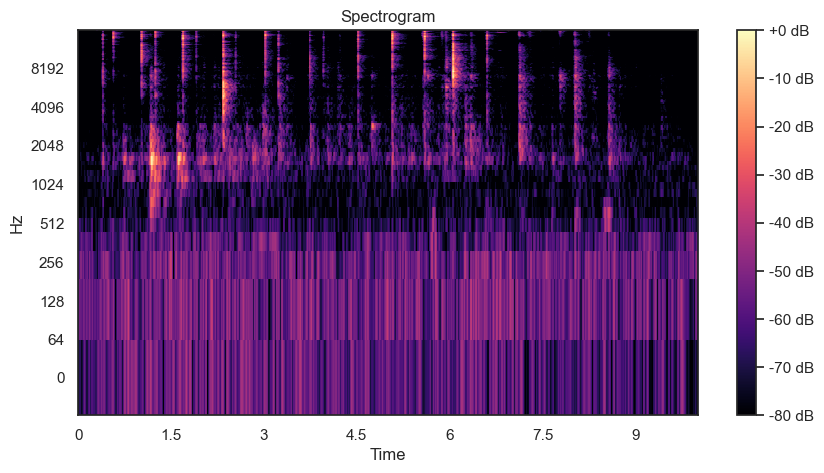

In [12]:
#Plot the transformed mel spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db_mel,
                            x_axis='time',
                            y_axis='log',
                            sr=sr,
                            ax=ax,)
ax.set_title('Spectrogram')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
plt.show

Draw waveform and spectrogram of audio

/tmp/ipykernel_4785/2946251138.py:13: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(librosa.stft(audio), ref=np.max), sr=sr, x_axis='time', y_axis='log')


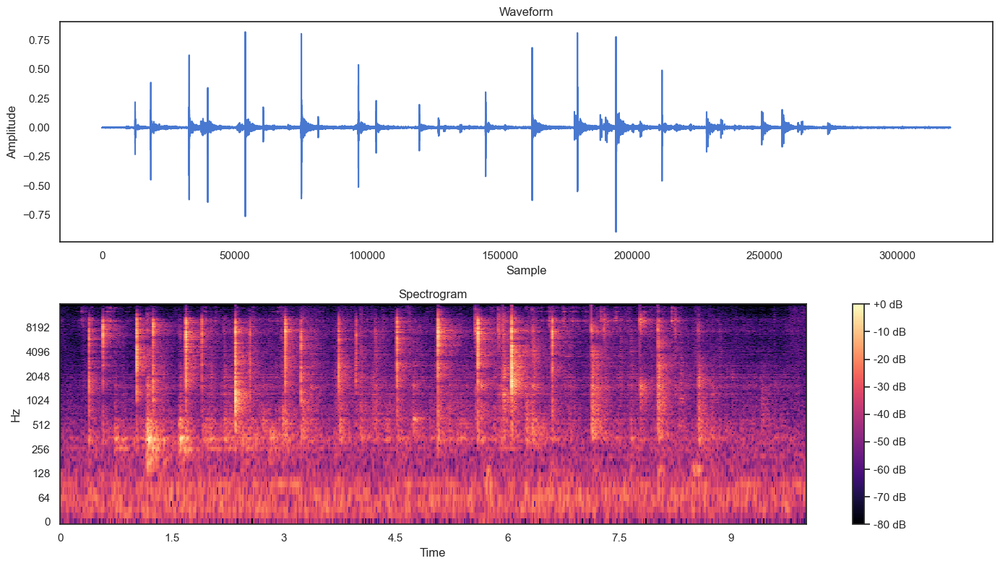

In [13]:
audio, sr = librosa.load(audio_files[0], sr=None)
plt.figure(figsize=(14, 8))

# Plot waveform
plt.subplot(2, 1, 1)
plt.plot(audio)
plt.title("Waveform")
plt.xlabel("Sample")
plt.ylabel("Amplitude")

# Plot spectrogram
plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(librosa.stft(audio), ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.title("Spectrogram")
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()

## Introduction show format input of m2dat

In [20]:
import sys
sys.path.append('/home/anhndv/vanh_ws/DCASE2025Task4')

In [ ]:
from src.datamodules.dataset.s5.dataset_s5_waveform import DatasetS5Waveform

dataset = DatasetS5Waveform(
    soundscape_dir="/home/anhndv/vanh_ws/DCASE2025Task4/data/dev_set/test/soundscape",
    oracle_target_dir="/home/anhndv/vanh_ws/DCASE2025Task4/data/dev_set/test/oracle_target",
    estimate_target_dir=None,
    n_sources=3,
    label_set='dcase2025t4',
    label_vector_mode='concat',
    sr=32000
)


In [75]:
dataset[idx]["label"]

['Dishes', 'Typing', 'silence']

In [85]:
idx = 13  # Chọn một index bất kỳ trong dataset
sr = 32000  # hoặc lấy từ dataset nếu có
mixture = dataset[idx]["mixture"]  # [4, wlen]
print(f"label: {dataset[idx]['label']}")

label: ['HairDryer', 'silence', 'silence']


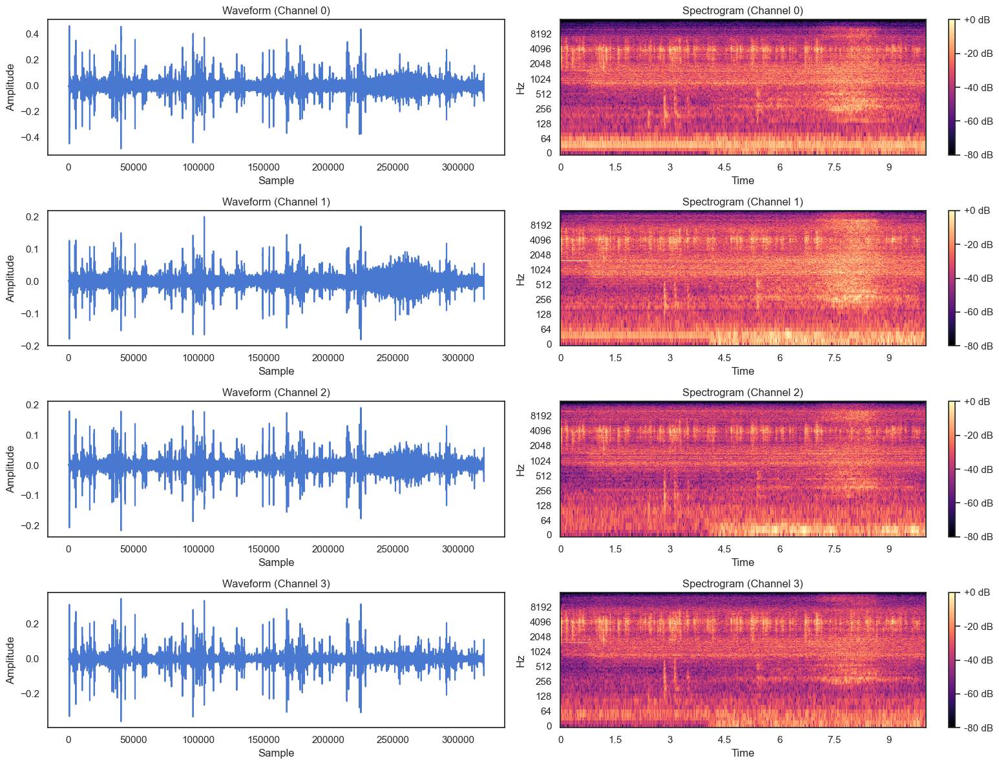

In [86]:
plt.figure(figsize=(16, 12))

for ch in range(4):
    # Plot waveform
    plt.subplot(4, 2, 2*ch+1)
    plt.plot(mixture[ch].numpy())
    plt.title(f"Waveform (Channel {ch})")
    plt.xlabel("Sample")
    plt.ylabel("Amplitude")

    # Plot spectrogram
    plt.subplot(4, 2, 2*ch+2)
    D = librosa.stft(mixture[ch].numpy())
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
    plt.title(f"Spectrogram (Channel {ch})")
    plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.show()

In [87]:
from scipy.ndimage import uniform_filter1d

mixture = dataset[idx]["mixture"].numpy()  # [4, wlen]
sr = 32000

# Tính STFT cho từng kênh
stft = [librosa.stft(mixture[ch]) for ch in range(4)]  # list 4 [freq, time]

# Tính ILD và IPD cho tất cả các cặp kênh (6 cặp) và làm mượt luôn
ILD_list = []
IPD_list = []
channel_pairs = [(0,1), (0,2), (0,3), (1,2), (1,3), (2,3)]
for i, j in channel_pairs:
    ILD = 20 * np.log10(np.abs(stft[i]) / (np.abs(stft[j]) + 1e-8))
    IPD = np.angle(stft[i]) - np.angle(stft[j])
    # Làm mượt theo thời gian (axis=1)
    ILD_smooth = uniform_filter1d(ILD, size=5, axis=1)
    IPD_smooth = uniform_filter1d(IPD, size=5, axis=1)
    ILD_list.append(ILD_smooth)
    IPD_list.append(IPD_smooth)

# Stack lại: spatial_feature shape = [12, freq, time] (6 ILD + 6 IPD)
spatial_feature = np.stack(ILD_list + IPD_list, axis=0)

print("Spatial feature shape:", spatial_feature.shape)
print("ILD shape:", ILD_list[0].shape)
print("IPD shape:", IPD_list[0].shape)

Spatial feature shape: (12, 1025, 626)
ILD shape: (1025, 626)
IPD shape: (1025, 626)


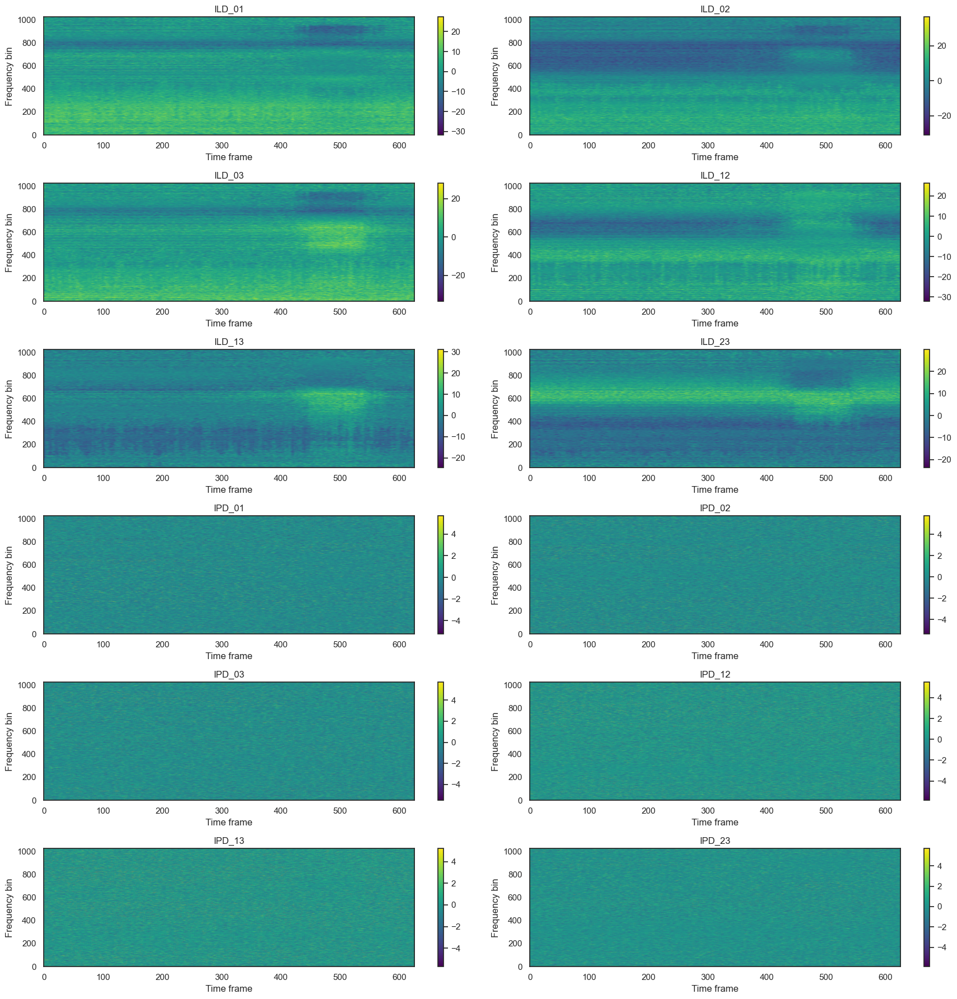

In [88]:
import matplotlib.pyplot as plt

feature_names = [
    'ILD_01', 'ILD_02', 'ILD_03', 'ILD_12', 'ILD_13', 'ILD_23',
    'IPD_01', 'IPD_02', 'IPD_03', 'IPD_12', 'IPD_13', 'IPD_23'
 ]

plt.figure(figsize=(18, 18))
for i in range(12):
    plt.subplot(6, 2, i+1)
    plt.imshow(spatial_feature[i], aspect='auto', origin='lower', cmap='viridis')
    plt.title(feature_names[i])
    plt.xlabel('Time frame')
    plt.ylabel('Frequency bin')
    plt.colorbar()
plt.tight_layout()
plt.show()

## Test code

In [1]:
import sys
sys.path.append('/home/anhndv/vanh_ws/DCASE2025Task4')

In [3]:
from src.utils import *

In [9]:
config = parse_yaml("/home/anhndv/vanh_ws/DCASE2025Task4/config/label/m2dat_head.yaml")

In [10]:
print(config)

{'task_name': '__', 'description': '__', 'deterministic': True, 'manual_seed': 0, 'datamodule': {'module': 'src.datamodules.datamodule', 'main': 'DataModule', 'args': {'train_dataloader': {'batch_size': 2, 'num_workers': 2, 'persistent_workers': True, 'pin_memory': True, 'dataset': {'module': 'src.datamodules.dataset.s5.dataset_s5', 'main': 'DatasetS5', 'args': {'config': {'spatialscaper': {'foreground_dir': 'data/dev_set/sound_event/train', 'background_dir': 'data/dev_set/noise/train', 'rir_dir': 'data/dev_set/room_ir/train', 'interference_dir': 'data/dev_set/interference/train', 'duration': 10.0, 'sr': 32000, 'max_event_overlap': 3, 'ref_db': -50, 'return_dry': False, 'return_wet': False, 'return_ir': False, 'return_background': False, 'ref_channel': -1, 'spatialize_direct_path_time_ms': None}, 'snr_range': [5, 20], 'nevent_range': [1, 3], 'inteference_snr_range': [0, 15], 'ninterference_range': [1, 2], 'dataset_length': 50000, 'shuffle_label': False}, 'n_sources': 3, 'label_set': 'd

In [11]:
print(config.keys())

dict_keys(['task_name', 'description', 'deterministic', 'manual_seed', 'datamodule', 'lightning_module', 'train'])


In [16]:
print(config["task_name"])
print(config["datamodule"]["main"])

__
DataModule


torch.Size([33, 13])


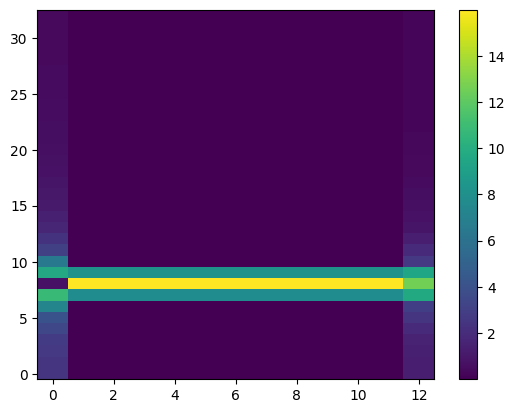

In [18]:
import torch

# Tạo tín hiệu giả: sóng sin
t = torch.linspace(0, 1, 400)
signal = torch.sin(2 * torch.pi * 50 * t)  # tần số 50Hz

# Tạo cửa sổ Hann
window = torch.hann_window(64)

# Tính STFT
spec = torch.stft(signal, n_fft=64, hop_length=32, window=window, return_complex=True)

print(spec.shape)  # (freq_bins, time_frames)


import matplotlib.pyplot as plt
plt.imshow(torch.abs(spec).numpy(), aspect='auto', origin='lower')
plt.colorbar()
plt.show()
